In [389]:
#General Imports
import os
import pandas as pd
import numpy as np
import string
import seaborn as sns

import plotly.express as px
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from wordcloud import WordCloud

In [390]:
#SpaCy Imports
import spacy
from spacy.lang.en.stop_words import STOP_WORDS

In [391]:
#ML Imports for NLP Analysis
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.naive_bayes import MultinomialNB

from sklearn.decomposition import PCA
from sklearn.decomposition import TruncatedSVD

from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score

# Problem:

With the rise of the digital age in the 2010s, video games have become an increasingly prominent medium of entertainment for youths and adults alike. The advent of Steam – a digital marketplace for video games – have made them globally accessible to anyone with at least an internet connection and a computer. The platform has a wide array of features available, but most critical to consumers and developers both are reviews. 

While individual customers can easily make use of reviews to their own benefit, game developers often face the challenge of parsing reviews to tackle business problems they may face. Thus, this analysis strives to explore available data on reviews for games on the Steam platform, using NLP analysis techniques to extract insight to support the business in solving questions such as:

- What are the general attitudes on the game?
- What are the topics the reviews are talking about?
- How are the game systems received by the player base?

To do so, we will be utilizing NLP analysis techniques:
- Sentiment Analysis
- Name Entity Recognition
- Topic Modeling


Data taken from:
https://www.kaggle.com/datasets/luthfim/steam-reviews-dataset?resource=download


In [392]:
os.chdir('C:\\Users\\ferre\\DA Cogent\\Capstone')

In [393]:
df = pd.read_csv('steam_reviews.csv')
df.head()

,date_posted,funny,helpful,hour_played,is_early_access_review,recommendation,review,title
0,2019-02-10,2,4,578,False,Recommended,&gt Played as German Reich&gt Declare war on B...,Expansion - Hearts of Iron IV: Man the Guns
1,2019-02-10,0,0,184,False,Recommended,yes.,Expansion - Hearts of Iron IV: Man the Guns
2,2019-02-07,0,0,892,False,Recommended,Very good game although a bit overpriced in my...,Expansion - Hearts of Iron IV: Man the Guns
3,2018-06-14,126,1086,676,False,Recommended,Out of all the reviews I wrote This one is pro...,Dead by Daylight
4,2017-06-20,85,2139,612,False,Recommended,Disclaimer I survivor main. I play games for f...,Dead by Daylight


Analysis to cover:
- Text summarization
- Extract topics
- Sentiment gauging 
- Review vs funny/helpful/hours played/recommendation (classification problem)

- NER

Visualizing:
- Word cloud
- Topic ranking
- n_grams potentially?
- Classification viz
- Crosstab for correlation btwn cat & cont (maybe hrs played)


Modules
- spacy
- gensim



In [394]:
df.title.value_counts()

PLAYERUNKNOWN'S BATTLEGROUNDS                    145685
Grand Theft Auto V                                99956
Rust                                              71088
Rocket League®                                    67907
Dead by Daylight                                  22221
MONSTER HUNTER: WORLD                             18412
ASTRONEER                                          2661
The Elder Scrolls V: Skyrim Special Edition        1473
RESIDENT EVIL 2 / BIOHAZARD RE:2                   1385
Sid Meier’s Civilization® VI                        522
Euro Truck Simulator 2                              501
Slay the Spire                                      260
Terraria                                            260
Subnautica                                          247
Left 4 Dead 2                                       221
Insurgency: Sandstorm                               220
RimWorld                                            204
Stardew Valley                                  

### Now, onto the analysis!

We need to be more specific with our exploration. Specifically, we need to select a specific game since games are wildly different from one another and don't often share the same features, target audiences and others. For the purposes of this investigation, we will take a look at one of the available games in the dataset: Grand Theft Auto V (here on referred to as GTAV).

In [395]:
df1 = df[df['title'] == 'Grand Theft Auto V'].reset_index(drop=True)
df1.head()

,date_posted,funny,helpful,hour_played,is_early_access_review,recommendation,review,title
0,2015-05-04,0,0,250,False,Not Recommended,I love the part in Online where you get banned...,Grand Theft Auto V
1,2015-04-26,3,5,438,False,Recommended,best Rockstar optimization so farI couldn't st...,Grand Theft Auto V
2,2017-02-15,0,0,523,False,Not Recommended,After having bought this game on PS3 PS4 and P...,Grand Theft Auto V
3,2017-06-15,1,5,1436,False,Not Recommended,Pros SP ModdingCons Take Two Interactive.,Grand Theft Auto V
4,2017-10-03,0,0,465,False,Not Recommended,Everything in the game now either flies shoots...,Grand Theft Auto V


### Playing around with Spacy - Preprocessing Tools

In [396]:
nlp = spacy.load('en_core_web_sm')

In [397]:
sample_text = df['review'][10]

In [398]:
doc = nlp(df1['review'][93])
doc

dislike online. Too many hackers lately have to keep joining new sessions.

In [399]:
#doc = nlp(sample_text)
nlp

In [400]:
#We can import or add specific stop words via spacy

print(STOP_WORDS) # SpaCy's default stop words
#STOP_WORDS.add("your_additional_stopwords_here")

{'hereafter', 'as', 'none', 'something', 'on', 'yourselves', 'towards', 'anyway', 'each', 'more', 'rly', 'via', "i'm", 'forty', 'first', 'three', 'V', 'ca', 'any', 'nobody', 'else', 'fifty', 'ours', '‘ve', 'everywhere', "'re", 'their', 'keep', 'her', 'into', 'them', 'auto', 'becomes', 'next', 'without', 'got', 'always', 'has', 'neither', 'perhaps', 'don', 'herself', 'for', 'elsewhere', 'hundred', 'moreover', 'll', 'across', 'own', 'within', 'name', '’ll', 'just', "'ll", 'and', 'will', 'already', 'alone', 'themselves', 'him', 'around', 'our', '’ve', 'latter', 'among', 'between', 'from', 'was', 'seemed', 'but', 'full', 'not', "'d", 'nor', "'ve", 'indeed', 'take', 'anything', 'how', 'it', "can't", 've', 'twenty', 'they', 'a', 'itself', 'show', 'where', 'make', 'yet', 'through', 'here', 'may', 'nevertheless', 'now', 'only', 'eleven', 'sometime', 'these', 'there', 'down', 'who', 'she', 'that', 'back', 'become', 'am', 'whether', 'when', 'doing', 'do', 'upon', 'being', '’m', '‘m', 'enough', '

- Stemming: removing suffixes from words (i.e. ness from preparedness), though this process is not 100% reliable to output meaningful words
    - For example, using stemming with laziness = lazi, which is not a real word

- Lemmatization: the process of converting words back into their root words

In [401]:
#Lemmatization

sentence = []
for w in doc:
  #If stopwords, remove
  if w.text != 'n' and not w.is_stop and not w.is_punct and not w.like_num:
    #Add lemmatized
    sentence.append(w.lemma_)
print(sentence)

['dislike', 'online', 'hacker', 'lately', 'join', 'new', 'session']


### Dataset exploration and cleaning

In [402]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99956 entries, 0 to 99955
Data columns (total 8 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   date_posted             99956 non-null  object
 1   funny                   99956 non-null  int64 
 2   helpful                 99956 non-null  int64 
 3   hour_played             99956 non-null  int64 
 4   is_early_access_review  99956 non-null  bool  
 5   recommendation          99956 non-null  object
 6   review                  99677 non-null  object
 7   title                   99956 non-null  object
dtypes: bool(1), int64(3), object(4)
memory usage: 5.4+ MB


In [403]:
#Convert date into datetime string
print(type(df1['date_posted'][1]))

<class 'str'>


In [404]:
df1.recommendation.value_counts()

Recommended        58989
Not Recommended    40967
Name: recommendation, dtype: int64

In [405]:
#No N/A values
df1.isna().any()

date_posted               False
funny                     False
helpful                   False
hour_played               False
is_early_access_review    False
recommendation            False
review                     True
title                     False
dtype: bool

In [406]:
#Some reviews are not completely in string form
df1['review'] = df1['review'].apply(str)


df1['review_len'] = df1.apply(lambda row: len(str(row['review'])), axis=1)
df1['review_len']

0          74
1         584
2        1588
3          41
4         224
         ... 
99951       9
99952      26
99953    1454
99954      43
99955       9
Name: review_len, Length: 99956, dtype: int64

In [407]:
#Looking at helpful, funny counts

print("Maximum helpful votes", max(df1['helpful']))
print("Maximum funny votes", max(df1['funny']))

print(df1['funny'].mean())

Maximum helpful votes 2696
Maximum funny votes 4294967295
1246089.2490095643


In [408]:
df1['helpful'].describe()

count    99956.000000
mean         0.685121
std         19.611913
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max       2696.000000
Name: helpful, dtype: float64

In [409]:
df1['funny'].describe()

count    9.995600e+04
mean     1.246089e+06
std      7.314651e+07
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      4.294967e+09
Name: funny, dtype: float64

The 'Funny' votes on reviews typically describe if a given review is humorous, voted on by other users. That being said, however, it's clear that the maximum votes on this is too large - either an error in storing the actual vote counts or potential botting issues, which is a prevalent issue in steam overall. Either way, I will replace these values with 0 for the time being.

In [410]:
def fix_funny(count):
  if(count > 10000):
    return 0
  else:
    return count

df1['funny'] = df1['funny'].apply(fix_funny)

In [411]:
df1['funny'].describe()

#Much better

count    99956.000000
mean         0.454420
std         24.370268
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max       5438.000000
Name: funny, dtype: float64

In [412]:
#Generate recommendation column in int form

df1['rec_val'] = df1['recommendation'] == 'Recommended'
df1['rec_val'] = df1['rec_val'].astype(int)

df1['rec_val']

0        0
1        1
2        0
3        0
4        0
        ..
99951    1
99952    0
99953    1
99954    1
99955    1
Name: rec_val, Length: 99956, dtype: int32

## Preliminary Visualizations

In [413]:
#Visualizing hours played vs recommendation

fig = px.scatter(df1, x='hour_played', y='recommendation', color = 'recommendation')
fig.update_layout(title='Hours Played on Recommendation', showlegend=False)
fig.update_xaxes(title='Hours Played')
fig.update_yaxes(title='')
fig.show()

In [414]:
#Visualizing length of reviews
fig = px.histogram(df1, x='review_len', nbins=100)
fig.update_layout(title='Review Length')
fig.update_xaxes(title='Review Length')
fig.update_yaxes(title='')
fig.show()

Review length appears to be quite skewed towards 

In [415]:
#Visualizing recommendation counts
fig = px. histogram(df1, x='recommendation', color='recommendation')
fig.update_xaxes(title='')
fig.update_yaxes(title='Counts')
fig.update_layout(title='Recommendation Counts', showlegend=False)
fig.show()

In [416]:
#Visualizing recommendation counts with respect to high helpful, funny votes
#Assuming that votes of more than 50 count as high votes

helpful_df1 = df1[df1['helpful'] > 50]
helpful_df1 = helpful_df1.reset_index()

funny_df1 = df1[df1['funny'] > 50]
funny_df1 = funny_df1.reset_index()

fig = go.Figure()
fig.add_trace(go.Histogram(name='High Helpful Votes', x=helpful_df1['recommendation']))
fig.add_trace(go.Histogram(name='High Funny Votes', x=funny_df1['recommendation']))

fig.update_layout(title='Recommendation Counts on High Helpful, Funny Votes', barmode='stack')
fig.show()

### NLP Analysis Preprocessing

In [417]:
df1.head()

,date_posted,funny,helpful,hour_played,is_early_access_review,recommendation,review,title,review_len,rec_val
0,2015-05-04,0,0,250,False,Not Recommended,I love the part in Online where you get banned...,Grand Theft Auto V,74,0
1,2015-04-26,3,5,438,False,Recommended,best Rockstar optimization so farI couldn't st...,Grand Theft Auto V,584,1
2,2017-02-15,0,0,523,False,Not Recommended,After having bought this game on PS3 PS4 and P...,Grand Theft Auto V,1588,0
3,2017-06-15,1,5,1436,False,Not Recommended,Pros SP ModdingCons Take Two Interactive.,Grand Theft Auto V,41,0
4,2017-10-03,0,0,465,False,Not Recommended,Everything in the game now either flies shoots...,Grand Theft Auto V,224,0


In [418]:
#Using spaCy and the string modules, we can isolate common stop words and non-alphanumeric elements
punctuations = string.punctuation
stop_words = spacy.lang.en.stop_words.STOP_WORDS

In [419]:
#Adding more stopwords specific to GTA V

stop_words |= {"can't","don't","got","let","i've","lot","actually","dont","want","game",
               "iv","grand","theft","auto","V","i'm","s","play","games", "thing", 
              "lt", "ve", "dis", "xd", "don", "ll","www", "t2", "gaem","rly", "iz", "r8", "m8","gam","gg"}

stop_words.add(punctuations)

## Sentiment Analysis

### Building a classifier to predict recommendation 

In [420]:
#Model
clf = MultinomialNB()
#vectorizer = CountVectorizer(min_df=5, stop_words=stop_words)

In [421]:
#Pipeline form
pipe = Pipeline([#('vectorizer', CountVectorizer(min_df=5, stop_words=stop_words)),
                ('vectorizer', TfidfVectorizer(min_df=5, norm='l2')),
                ('clf', MultinomialNB())])

In [422]:
#We only need review, recommendation
X = df1['review']
y = df1['recommendation']

In [423]:
#Manual Vectorize
X_vec = vectorizer.fit_transform(X)

In [424]:
#X_train, X_test, y_train, y_test = train_test_split(X_vec, y, test_size=0.40, random_state=1)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.40, random_state=1)

In [425]:
#Pipeline method
pipe.fit(X_train, y_train)

#Manual method
#clf.fit(X_train, y_train)

Pipeline(steps=[('vectorizer', TfidfVectorizer(min_df=5)),
                ('clf', MultinomialNB())])

In [426]:
pipe.named_steps

{'vectorizer': TfidfVectorizer(min_df=5), 'clf': MultinomialNB()}

In [427]:
y_pred = pipe.predict(X_test)

In [428]:
print(classification_report(y_test, y_pred)) 

                 precision    recall  f1-score   support

Not Recommended       0.86      0.78      0.82     16495
    Recommended       0.85      0.91      0.88     23488

       accuracy                           0.86     39983
      macro avg       0.86      0.84      0.85     39983
   weighted avg       0.86      0.86      0.85     39983



In [429]:
clf_report = classification_report(y_test, y_pred, output_dict=True)
clf_report

{'Not Recommended': {'precision': 0.8560873327564401,
  'recall': 0.7796908153986056,
  'f1-score': 0.816105082809823,
  'support': 16495},
 'Recommended': {'precision': 0.8544070512820513,
  'recall': 0.9079529972752044,
  'f1-score': 0.8803665785997358,
  'support': 23488},
 'accuracy': 0.8550383913163094,
 'macro avg': {'precision': 0.8552471920192457,
  'recall': 0.843821906336905,
  'f1-score': 0.8482358307047794,
  'support': 39983},
 'weighted avg': {'precision': 0.8551002519653428,
  'recall': 0.8550383913163094,
  'f1-score': 0.8538554770552141,
  'support': 39983}}

<AxesSubplot:>

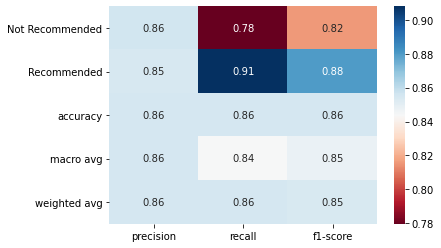

In [430]:
sns.heatmap(pd.DataFrame(clf_report).iloc[:-1, :].T, annot=True, cmap='RdBu')

In [431]:
#Accuracy Score
accuracy_score(y_test, y_pred)

0.8550383913163094

       0      1
0  12861   3634
1   2162  21326


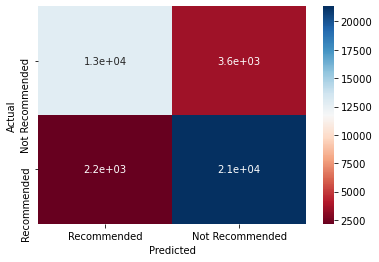

In [432]:
cfmat = pd.DataFrame(confusion_matrix(y_test, y_pred))
print(cfmat)

cf = plt.subplot()
sns.heatmap(cfmat, annot=True, cmap='RdBu')

cf.set_xlabel('Predicted')
cf.set_ylabel('Actual')
cf.xaxis.set_ticklabels(['Recommended', 'Not Recommended'])
cf.yaxis.set_ticklabels(['Not Recommended', 'Recommended'])
plt.show()

## Topic Modeling

We can extract topics generated in vectorized tokens and visualize this in the form of wordclouds. 

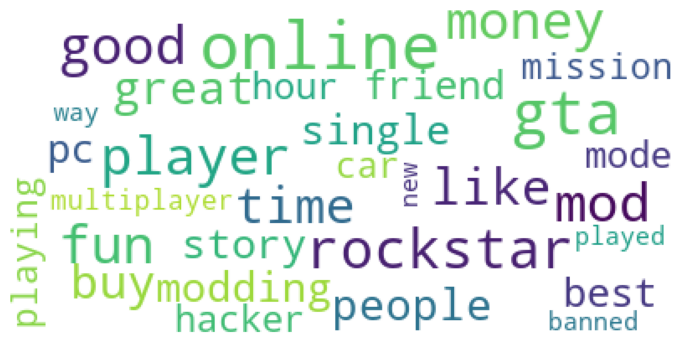

In [433]:
#Simple Wordcloud

wc = WordCloud(background_color='white', 
                         max_words=30, 
                         stopwords=stop_words, 
                         collocations=False, 
                         max_font_size=40, 
                         random_state=42)

wc=wc.generate(" ".join(df1['review']).lower())


plt.figure(figsize=(12,8))
plt.imshow(wc)
plt.axis("off")
plt.show()

In [434]:
#Functions for wordcloud gen

def print_top_words(model, feature_names, n_top_words, colormap='viridis'):
    for topic_idx, topic in enumerate(model.components_):
        
        message = " ".join([feature_names[i]
                             for i in topic.argsort()[:-n_top_words - 1:-1]])
        
        generate_wordcloud(message,colormap)
    print()    
    
def generate_wordcloud(text, colormap):
    wordcloud = WordCloud(background_color='white',
                          max_words = 30,
                          relative_scaling = 1.0,
                          colormap=colormap,
                          stopwords = stop_words,
                          max_font_size=40,
                          random_state=42
                          ).generate(text)
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.show()

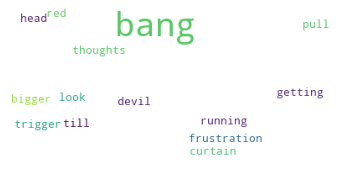

In [435]:
#Test function
text = 'all these thoughts running through my head by my side till the curtain look red, frustration is getting bigger bang bang bang pull my devil trigger'
generate_wordcloud(text, 'viridis')

In [436]:
#Build vectorizer and fit to training set
tfidf_vec = TfidfVectorizer(min_df=5, norm='l2')
X_train_topic = tfidf_vec.fit_transform(X_train)

#Dealing with dimensionality - try TruncatedSVD since PCA did not work
tsvd = TruncatedSVD(n_components=5, random_state=1)

doc_topics = tsvd.fit_transform(X_train_topic)

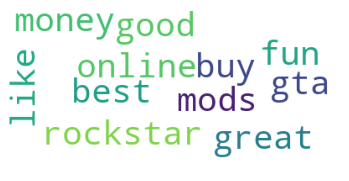

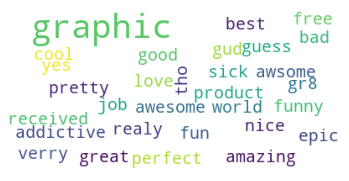

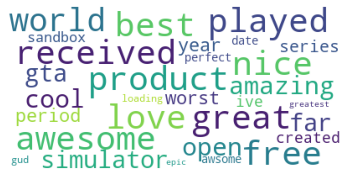

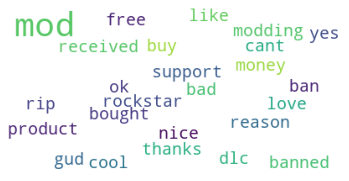

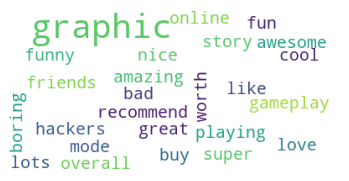

In [437]:
tfidf_vec_feature_names = tfidf_vec.get_feature_names()
print_top_words(tsvd, tfidf_vec_feature_names, 50)

In [438]:
#Wordcloud for positive reviews
positive_df = df1[df1['rec_val'] == 1]

### Positive Review Wordcloud

In [439]:
#Positive reviews
X_positive = positive_df['review']
y_positive = positive_df['rec_val']

X_train, X_test, y_train, y_test = train_test_split(X_positive, y_positive, test_size=0.4, random_state=1)

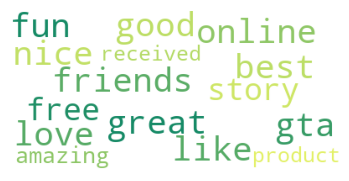

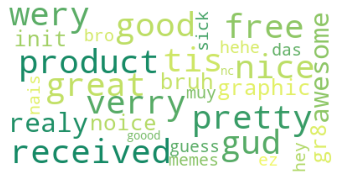

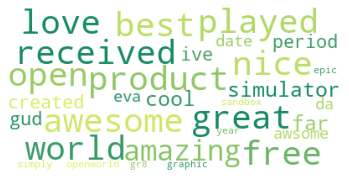

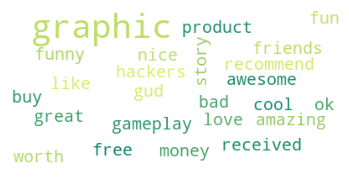

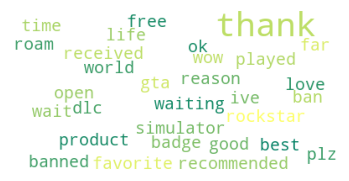

In [440]:
#Build vectorizer and fit to training set
X_train_topic = tfidf_vec.fit_transform(X_train)

doc_topics = tsvd.fit_transform(X_train_topic)

tfidf_vec_feature_names = tfidf_vec.get_feature_names()
print_top_words(tsvd, tfidf_vec_feature_names, 50, colormap='summer')

### Negative Review Wordcloud

In [441]:
#Wordcloud for negative review
negative_df = df1[df1['rec_val'] == 0]

#Negative reviews
X_negative = negative_df['review']
y_negative = negative_df['rec_val']

X_train, X_test, y_train, y_test = train_test_split(X_negative, y_negative, test_size=0.4, random_state=1)

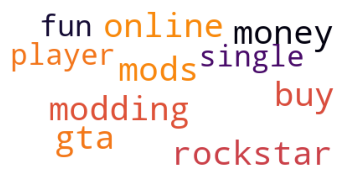

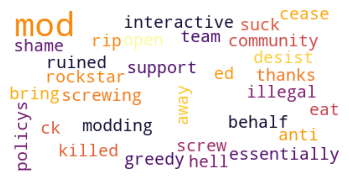

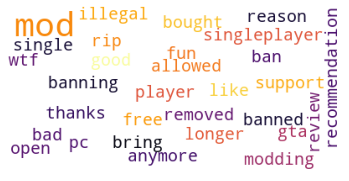

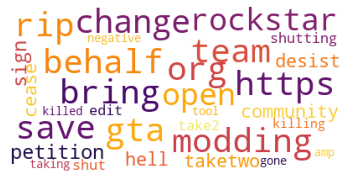

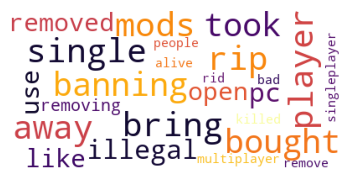

In [442]:
#Build vectorizer and fit to training set
X_train_topic = tfidf_vec.fit_transform(X_train)

doc_topics = tsvd.fit_transform(X_train_topic)

tfidf_vec_feature_names = tfidf_vec.get_feature_names()
print_top_words(tsvd, tfidf_vec_feature_names, 50, colormap='inferno')